samples if 5% data is missing,impute with MEdian/Sample
if >30% do KNN



In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
from sklearn.ensemble import BaggingClassifier
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.linear_model import Ridge,Lasso,ElasticNet
from sklearn.model_selection import KFold
from sklearn import metrics
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn import  model_selection

In [0]:
df=pd.read_csv('Concrete.csv')
df.head()

,Cement,Blast Furnace Slag,Fly Ash,Water,Superplasticizer,Coarse Aggregate,Fine Aggregate,Age,Concrete compressive strength
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28,79.99
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28,61.89
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270,40.27
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365,41.05
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360,44.30


In [0]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1030 entries, 0 to 1029
Data columns (total 9 columns):
Cement                           1030 non-null float64
Blast Furnace Slag               1030 non-null float64
Fly Ash                          1030 non-null float64
Water                            1030 non-null float64
Superplasticizer                 1030 non-null float64
Coarse Aggregate                 1030 non-null float64
Fine Aggregate                   1030 non-null float64
Age                              1030 non-null int64
Concrete compressive strength    1030 non-null float64
dtypes: float64(8), int64(1)
memory usage: 72.5 KB


In [0]:
df.corr()

,Cement,Blast Furnace Slag,Fly Ash,Water,Superplasticizer,Coarse Aggregate,Fine Aggregate,Age,Concrete compressive strength
Cement,1.000000,-0.275216,-0.397467,-0.081587,0.092386,-0.109349,-0.222718,0.081946,0.497832
Blast Furnace Slag,-0.275216,1.000000,-0.323580,0.107252,0.043270,-0.283999,-0.281603,-0.044246,0.134829
Fly Ash,-0.397467,-0.323580,1.000000,-0.256984,0.377503,-0.009961,0.079108,-0.154371,-0.105755
Water,-0.081587,0.107252,-0.256984,1.000000,-0.657533,-0.182294,-0.450661,0.277618,-0.289633
Superplasticizer,0.092386,0.043270,0.377503,-0.657533,1.000000,-0.265999,0.222691,-0.192700,0.366079
Coarse Aggregate,-0.109349,-0.283999,-0.009961,-0.182294,-0.265999,1.000000,-0.178481,-0.003016,-0.164935
Fine Aggregate,-0.222718,-0.281603,0.079108,-0.450661,0.222691,-0.178481,1.000000,-0.156095,-0.167241
Age,0.081946,-0.044246,-0.154371,0.277618,-0.192700,-0.003016,-0.156095,1.000000,0.328873
Concrete compressive strength,0.497832,0.134829,-0.105755,-0.289633,0.366079,-0.164935,-0.167241,0.328873,1.000000


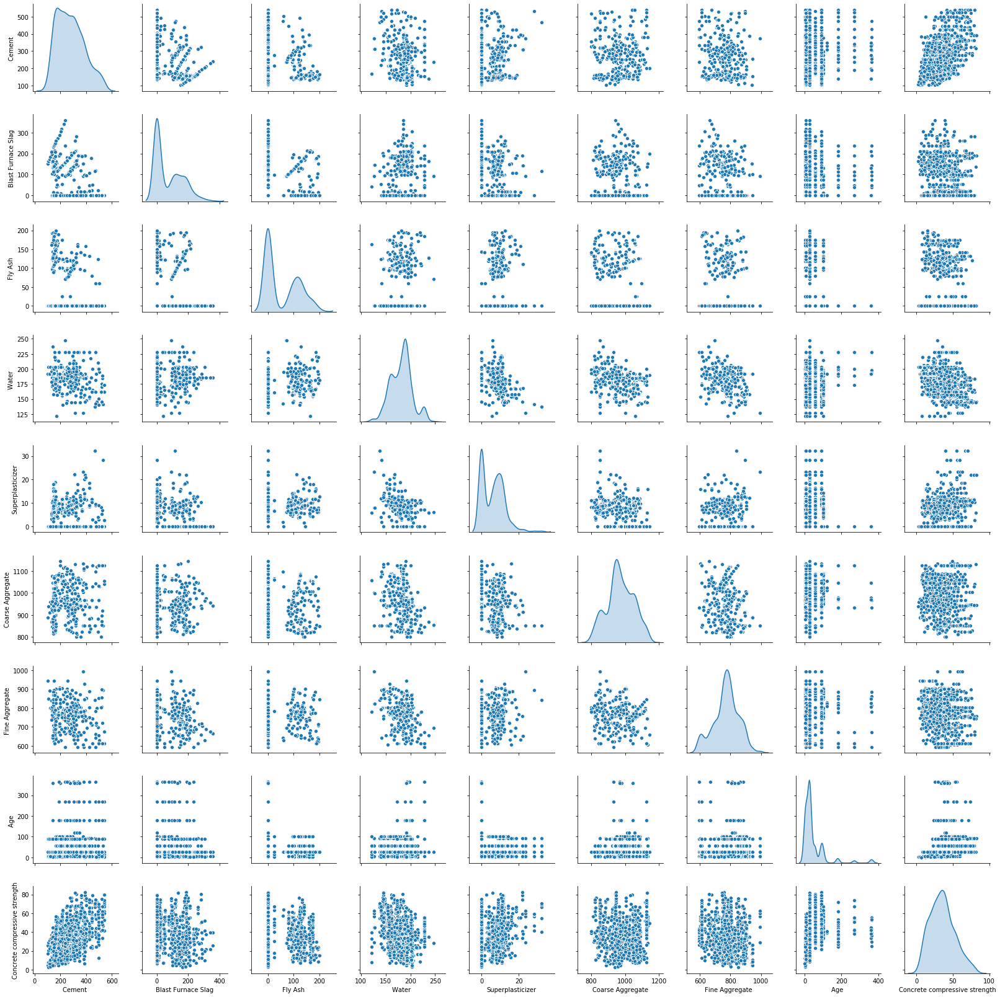

In [0]:
sns.pairplot(df,diag_kind='kde')

1)MVLR

2)KNN-R

3)DT-R

4)RF-R

5)Bagging Reg(DT Bag)

6)Ada boost(DT)

7)Gradient Boost


# MVLR

In [0]:
a=[]
from scipy.stats import levene
for i in list(df.columns)[:-1]:
    p=levene(df[i],df['Concrete compressive strength'])[1]
    print(p)
    if(p<0.05):
        a.append(i)
print(a)

3.808814475843217e-250
1.0602702086604272e-135
6.895004041513094e-83
2.7710396977949434e-10
2.1162500220923255e-127
5.4549852696796274e-194
7.543516221960523e-159
1.1118984098565435e-21
['Cement ', 'Blast Furnace Slag', 'Fly Ash', 'Water ', 'Superplasticizer', 'Coarse Aggregate', 'Fine Aggregate ', 'Age ']


You can include all these features

In [0]:
df.describe()

,Cement,Blast Furnace Slag,Fly Ash,Water,Superplasticizer,Coarse Aggregate,Fine Aggregate,Age,Concrete compressive strength
count,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000
mean,281.167864,73.895825,54.188350,181.567282,6.204660,972.918932,773.580485,45.662136,35.817961
std,104.506364,86.279342,63.997004,21.354219,5.973841,77.753954,80.175980,63.169912,16.705742
min,102.000000,0.000000,0.000000,121.800000,0.000000,801.000000,594.000000,1.000000,2.330000
25%,192.375000,0.000000,0.000000,164.900000,0.000000,932.000000,730.950000,7.000000,23.710000
50%,272.900000,22.000000,0.000000,185.000000,6.400000,968.000000,779.500000,28.000000,34.445000
75%,350.000000,142.950000,118.300000,192.000000,10.200000,1029.400000,824.000000,56.000000,46.135000
max,540.000000,359.400000,200.100000,247.000000,32.200000,1145.000000,992.600000,365.000000,82.600000


In [0]:
X=df.drop(['Concrete compressive strength'],axis=1)
y=df['Concrete compressive strength']

In [0]:
#optimum no of features to select for RFE
nof_list=np.arange(1,11)            
high_score=0
#Variable to store the optimum features
nof=0           
score_list =[]
for n in range(len(nof_list)):
    X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.3, random_state = 0)
    model = LinearRegression()
    rfe = RFE(model,nof_list[n])
    X_train_rfe = rfe.fit_transform(X_train,y_train)
    X_test_rfe = rfe.transform(X_test)
    model.fit(X_train_rfe,y_train)
    score = model.score(X_test_rfe,y_test)
    score_list.append(score)
    if(score>high_score):
        high_score = score
        nof = nof_list[n]
print("Optimum number of features: %d" %nof)
print("Score with %d features: %f" % (nof, high_score))

Optimum number of features: 7
Score with 7 features: 0.637578


In [0]:
cols = list(X.columns)
model = LinearRegression()
#Initializing RFE model
rfe = RFE(model, 7)             
#Transforming data using RFE
X_rfe = rfe.fit_transform(X,y)  
#Fitting the data to model
model.fit(X_rfe,y)              
temp = pd.Series(rfe.support_,index = cols)
selected_features_rfe = temp[temp==True].index
print(selected_features_rfe)

Index(['Cement ', 'Blast Furnace Slag', 'Fly Ash', 'Water ',
       'Superplasticizer', 'Fine Aggregate ', 'Age '],
      dtype='object')


In [0]:
X_new=X[selected_features_rfe]

In [0]:
m1=LinearRegression()
m2=Ridge()
m3=Lasso()
m4=ElasticNet()
models=[]
models.append(('Linear Regression',m1))
models.append(('Ridge',m2))
models.append(('Lasso',m3))
models.append(('ElasticNet',m4))

In [0]:
from sklearn.model_selection import KFold
from sklearn import metrics
kf=KFold(n_splits=5,shuffle=True,random_state=0)
for model,name in zip([m1,m2,m3,m4],['Linear_Regression','Ridge','Lasso','ElasticNet']):
    rmse=[]
    for train_idx,test_idx in kf.split(X_new,y):#indexes of test and train willbe stored
        Xtrain,Xtest=X_new.iloc[train_idx,:],X_new.iloc[test_idx,:]
        Ytrain,Ytest=y.iloc[train_idx],y.iloc[test_idx]
        
        model.fit(Xtrain,Ytrain)
        Y_predict=model.predict(Xtest)
        #cm=metrics.confusion_matrix(Ytest,Y_predict)
        mse=metrics.mean_squared_error(Ytest,Y_predict)
        rmse.append(np.sqrt(mse))
    print(model.score(Xtrain,Ytrain))
    print('RMSE scores:%0.03f (+/-%0.5f)[%s]'%(np.mean(rmse),np.var(rmse,ddof=1),name))

0.6108699057825211
RMSE scores:10.478 (+/-0.41625)[Linear_Regression]
0.6108699057759036
RMSE scores:10.478 (+/-0.41625)[Ridge]
0.6107124071917626
RMSE scores:10.481 (+/-0.42347)[Lasso]
0.6108198926396965
RMSE scores:10.479 (+/-0.42096)[ElasticNet]


Linear Regression: 10.437936 (0.592382)
Ridge: 10.437935 (0.592383)
Lasso: 10.439892 (0.595253)
ElasticNet: 10.438258 (0.594082)


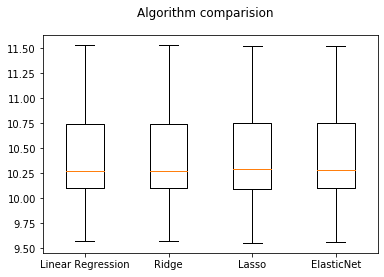

In [0]:
results=[]
names=[]
for name,model in models:
    kfold=model_selection.KFold(n_splits=7,shuffle=True,random_state=0)
    cv_result=model_selection.cross_val_score(model,X_new,y,cv=kfold,scoring='neg_mean_squared_error')
    results.append(np.sqrt(np.abs(cv_result)))
    names.append(name)
    print("%s: %f (%f)" % (name,np.mean(np.sqrt(np.abs(cv_result))),np.std(np.sqrt(np.abs(cv_result)))))
fig=plt.figure()
fig.suptitle("Algorithm comparision")
ax=fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

Mean Squared Logarthmic Error(MSLR):In certain domains,they don't need the model to Underestimate,they can afford over estimate and is done only when client asks:-

(1/N)Summation(i to N)(log10(yi+1)+log10(yicap+1))

In [0]:
(np.log10(21)-np.log10(11))**2#over estimate

0.07886358464577936

In [0]:
(np.log10(21)-np.log10(31))**2#under estimate

0.02860915117342321

Both having a difference of 10 only

10.437936 (0.592382) MVLR

# KNN

In [0]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
for i in X.columns:
    X[i]=sc.fit_transform(X[[i]])
X.head()

,Cement,Blast Furnace Slag,Fly Ash,Water,Superplasticizer,Coarse Aggregate,Fine Aggregate,Age
0,2.477915,-0.856888,-0.847144,-0.916764,-0.620448,0.863154,-1.217670,-0.279733
1,2.477915,-0.856888,-0.847144,-0.916764,-0.620448,1.056164,-1.217670,-0.279733
2,0.491425,0.795526,-0.847144,2.175461,-1.039143,-0.526517,-2.240917,3.553066
3,0.491425,0.795526,-0.847144,2.175461,-1.039143,-0.526517,-2.240917,5.057677
4,-0.790459,0.678408,-0.847144,0.488793,-1.039143,0.070527,0.647884,4.978487


In [0]:
from sklearn.neighbors import KNeighborsRegressor


In [0]:
import sys
import warnings

if not sys.warnoptions:
    warnings.simplefilter("ignore")

In [0]:
knn=KNeighborsRegressor()
params={'n_neighbors':np.arange(1,200),'weights':['uniform','distance']}
GS=GridSearchCV(knn,params,cv=7,scoring='neg_mean_squared_error')
GS.fit(X,y)

GridSearchCV(cv=7, error_score='raise-deprecating',
             estimator=KNeighborsRegressor(algorithm='auto', leaf_size=30,
                                           metric='minkowski',
                                           metric_params=None, n_jobs=None,
                                           n_neighbors=5, p=2,
                                           weights='uniform'),
             iid='warn', n_jobs=None,
             param_grid={'n_neighbors': array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  3...
       144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156,
       157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169,
       170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182,
       183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195,
       196, 197, 198, 199]),
           

In [0]:
GS.best_params_

{'n_neighbors': 9, 'weights': 'distance'}

In [0]:
knn=KNeighborsRegressor(n_neighbors=9,weights='distance')

In [0]:
models=[]
models.append(('MVLR',m1))
models.append(('KNN_BASE',knn))

MVLR: 10.437936 (0.592382)
KNN_BASE: 7.429258 (0.615279)


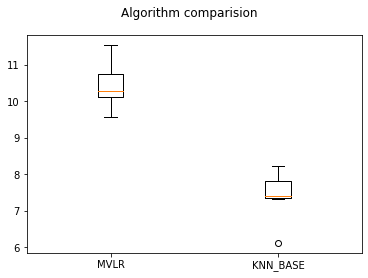

In [0]:
results=[]
names=[]
for name,model in models:
    kfold=model_selection.KFold(n_splits=7,shuffle=True,random_state=0)
    cv_result=model_selection.cross_val_score(model,X_new,y,cv=kfold,scoring='neg_mean_squared_error')
    results.append(np.sqrt(np.abs(cv_result)))
    names.append(name)
    print("%s: %f (%f)" % (name,np.mean(np.sqrt(np.abs(cv_result))),np.std(np.sqrt(np.abs(cv_result)))))
fig=plt.figure()
fig.suptitle("Algorithm comparision")
ax=fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

# Decision Tree

In [0]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import AdaBoostRegressor,GradientBoostingRegressor

In [0]:
dt_model=DecisionTreeRegressor(criterion='mse',random_state=0)
models.append(('Decision Tree',dt_model))

In [0]:
# model_ada_rf=AdaBoostRegressor(base_estimator=rf_model)
# params={'n_estimators':np.arange(1,100)}
# GS=GridSearchCV(model_ada_rf,params,cv=7)
# GS.fit(X,y)

In [0]:
GS.best_params_

{'n_neighbors': 9, 'weights': 'distance'}

In [0]:
rf_model=RandomForestRegressor(n_estimators=537,criterion='mse')
bag_model=BaggingRegressor(n_estimators=10)
model_ada=AdaBoostRegressor(n_estimators=50)#default decision tree
model_grad=GradientBoostingRegressor(n_estimators=2600)
model_ada_rf=AdaBoostRegressor(base_estimator=rf_model,n_estimators=100)




In [0]:
models=[]
models.append(('MVLR',m1))
models.append(('KNN_BASE',knn))
models.append(('RandomForest',rf_model))
models.append(('BaggedDT',bag_model))
models.append(('Adaboost_DT',model_ada))
models.append(('GradientBoosting',model_grad))
models.append(('Adaboost_RF',model_ada_rf))

MVLR: 10.437936 (0.592382)
KNN_BASE: 7.429258 (0.615279)
RandomForest: 4.824201 (0.385601)
BaggedDT: 5.182864 (0.429289)
Adaboost_DT: 7.636349 (0.352150)
GradientBoosting: 4.004633 (0.362040)
Adaboost_RF: 4.851064 (0.472718)


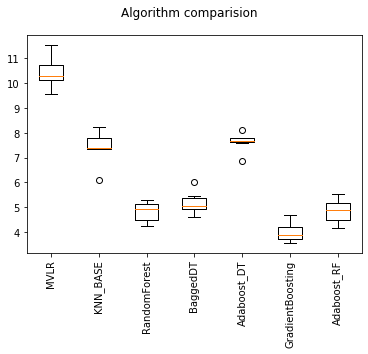

In [0]:
results=[]
names=[]
for name,model in models:
    kfold=model_selection.KFold(n_splits=7,shuffle=True,random_state=0)
    cv_result=model_selection.cross_val_score(model,X_new,y,cv=kfold,scoring='neg_mean_squared_error')
    results.append(np.sqrt(np.abs(cv_result)))
    names.append(name)
    print("%s: %f (%f)" % (name,np.mean(np.sqrt(np.abs(cv_result))),np.std(np.sqrt(np.abs(cv_result)))))
fig=plt.figure()
fig.suptitle("Algorithm comparision")
ax=fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

In [0]:
from sklearn.ensemble import VotingRegressor

In [0]:
stacked=VotingRegressor(estimators=[('GradientBoosting',model_grad),('Random Forest',rf_model)])

In [0]:
models.append(('stacked',stacked))

MVLR: 10.437936 (0.592382)
KNN_BASE: 7.429258 (0.615279)
RandomForest: 4.835137 (0.387526)
BaggedDT: 5.218212 (0.318587)
Adaboost_DT: 7.704972 (0.570470)
GradientBoosting: 4.002852 (0.369660)
Adaboost_RF: 4.875495 (0.363328)
stacked: 4.058629 (0.313215)


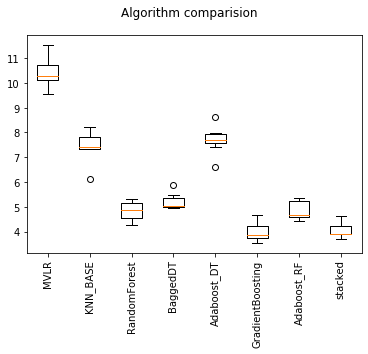

In [0]:
results=[]
names=[]
for name,model in models:
    kfold=model_selection.KFold(n_splits=7,shuffle=True,random_state=0)
    cv_result=model_selection.cross_val_score(model,X_new,y,cv=kfold,scoring='neg_mean_squared_error')
    results.append(np.sqrt(np.abs(cv_result)))
    names.append(name)
    print("%s: %f (%f)" % (name,np.mean(np.sqrt(np.abs(cv_result))),np.std(np.sqrt(np.abs(cv_result)))))
fig=plt.figure()
fig.suptitle("Algorithm comparision")
ax=fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

Gradient Boost is the best model

In [0]:
model_grad.fit(X[:1000],y[:1000])

GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
                          learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=2600,
                          n_iter_no_change=None, presort='auto',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)

In [0]:
ypred=model_grad.predict(X.iloc[1010:,:])


In [0]:
ypred

array([39.95855808, 40.73224753, 62.83870797, 41.60545401, 33.29869152,
       48.03193644, 15.08878856, 38.59041479, 37.33102591, 35.25038125,
       42.55925397, 31.73477302, 41.75368253, 38.87576028, 38.06263774,
       45.76479564, 32.16449263, 24.85165561, 36.3224478 , 35.21652884])

In [0]:
y[1010:]

1010    40.06
1011    43.80
1012    61.24
1013    40.87
1014    33.31
1015    52.43
1016    15.09
1017    38.46
1018    37.27
1019    35.23
1020    42.14
1021    31.88
1022    41.54
1023    39.46
1024    37.92
1025    44.28
1026    31.18
1027    23.70
1028    32.77
1029    32.40
Name: Concrete compressive strength, dtype: float64

# XG boost

In [0]:
from xgboost import XGBRegressor

In [0]:
model_xgb=XGBRegressor(n_estimators=20000,learning_rate=0.05,objective='reg:squarederror',booster='gbtree',max_depth=4)

In [0]:
models=[]
models.append(('XG boost',model_xgb))

In [0]:
results=[]
names=[]
for name,model in models:
    kfold=model_selection.KFold(n_splits=7,shuffle=True,random_state=0)
    cv_result=model_selection.cross_val_score(model,X_new,y,cv=kfold,scoring='neg_mean_squared_error')
    results.append(np.sqrt(np.abs(cv_result)))
    names.append(name)
    print("%s: %f (%f)" % (name,np.mean(np.sqrt(np.abs(cv_result))),np.std(np.sqrt(np.abs(cv_result)))))
fig=plt.figure()
fig.suptitle("Algorithm comparision")
ax=fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

# Breast cancer

In [5]:
from google.colab import files
files.upload()

Saving wisc_bc_data.csv to wisc_bc_data.csv


{'wisc_bc_data.csv': b'id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,points_mean,symmetry_mean,dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,points_se,symmetry_se,dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,points_worst,symmetry_worst,dimension_worst\r\n87139402,B,12.32,12.39,78.85,464.1,0.1028,0.06981,0.03987,0.037,0.1959,0.05955,0.236,0.6656,1.67,17.43,0.008045,0.0118,0.01683,0.01241,0.01924,0.002248,13.5,15.64,86.97,549.1,0.1385,0.1266,0.1242,0.09391,0.2827,0.06771\r\n8910251,B,10.6,18.95,69.28,346.4,0.09688,0.1147,0.06387,0.02642,0.1922,0.06491,0.4505,1.197,3.43,27.1,0.00747,0.03581,0.03354,0.01365,0.03504,0.003318,11.88,22.94,78.28,424.8,0.1213,0.2515,0.1916,0.07926,0.294,0.07587\r\n905520,B,11.04,16.83,70.92,373.2,0.1077,0.07804,0.03046,0.0248,0.1714,0.0634,0.1967,1.387,1.342,13.54,0.005158,

In [6]:
df=pd.read_csv('wisc_bc_data.csv')
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,points_mean,symmetry_mean,dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,points_se,symmetry_se,dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,points_worst,symmetry_worst,dimension_worst
0,87139402,B,12.32,12.39,78.85,464.1,0.10280,0.06981,0.03987,0.03700,0.1959,0.05955,0.2360,0.6656,1.670,17.43,0.008045,0.011800,0.01683,0.012410,0.01924,0.002248,13.50,15.64,86.97,549.1,0.1385,0.1266,0.12420,0.09391,0.2827,0.06771
1,8910251,B,10.60,18.95,69.28,346.4,0.09688,0.11470,0.06387,0.02642,0.1922,0.06491,0.4505,1.1970,3.430,27.10,0.007470,0.035810,0.03354,0.013650,0.03504,0.003318,11.88,22.94,78.28,424.8,0.1213,0.2515,0.19160,0.07926,0.2940,0.07587
2,905520,B,11.04,16.83,70.92,373.2,0.10770,0.07804,0.03046,0.02480,0.1714,0.06340,0.1967,1.3870,1.342,13.54,0.005158,0.009355,0.01056,0.007483,0.01718,0.002198,12.41,26.44,79.93,471.4,0.1369,0.1482,0.10670,0.07431,0.2998,0.07881
3,868871,B,11.28,13.39,73.00,384.8,0.11640,0.11360,0.04635,0.04796,0.1771,0.06072,0.3384,1.3430,1.851,26.33,0.011270,0.034980,0.02187,0.019650,0.01580,0.003442,11.92,15.77,76.53,434.0,0.1367,0.1822,0.08669,0.08611,0.2102,0.06784
4,9012568,B,15.19,13.21,97.65,711.8,0.07963,0.06934,0.03393,0.02657,0.1721,0.05544,0.1783,0.4125,1.338,17.72,0.005012,0.014850,0.01551,0.009155,0.01647,0.001767,16.20,15.73,104.50,819.1,0.1126,0.1737,0.13620,0.08178,0.2487,0.06766


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
id                   569 non-null int64
diagnosis            569 non-null object
radius_mean          569 non-null float64
texture_mean         569 non-null float64
perimeter_mean       569 non-null float64
area_mean            569 non-null float64
smoothness_mean      569 non-null float64
compactness_mean     569 non-null float64
concavity_mean       569 non-null float64
points_mean          569 non-null float64
symmetry_mean        569 non-null float64
dimension_mean       569 non-null float64
radius_se            569 non-null float64
texture_se           569 non-null float64
perimeter_se         569 non-null float64
area_se              569 non-null float64
smoothness_se        569 non-null float64
compactness_se       569 non-null float64
concavity_se         569 non-null float64
points_se            569 non-null float64
symmetry_se          569 non-null float64
dimension_se    

In [8]:
df['diagnosis'].value_counts()

B    357
M    212
Name: diagnosis, dtype: int64

B->Benign
M->Malignent

In [0]:
df['diagnosis'].replace({'B':0,'M':1},inplace=True)

/usr/local/lib/python3.6/dist-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/usr/local/lib/python3.6/dist-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


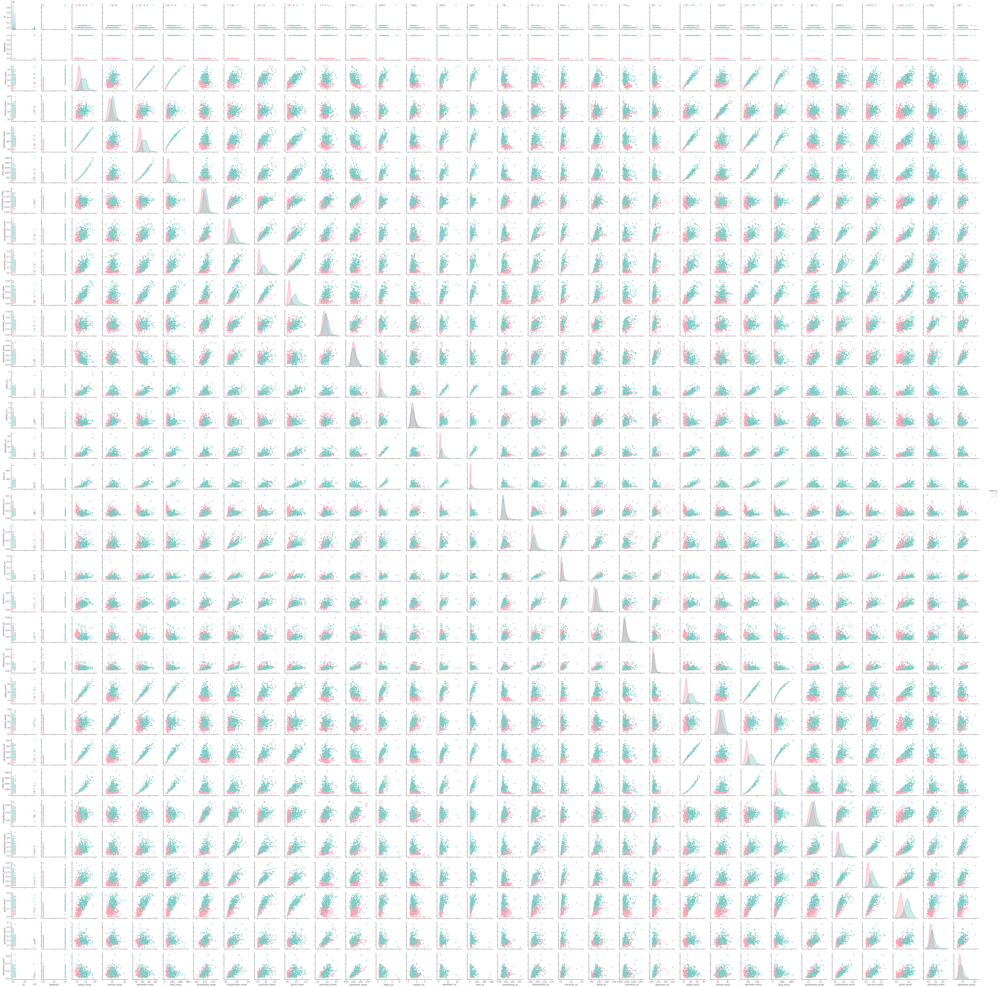

In [32]:
sns.set(style='ticks',color_codes=True)
sns.pairplot(df,hue='diagnosis',palette='husl')
plt.show()

In [8]:
abs(df.corr()['diagnosis']).sort_values()

symmetry_se          0.006522
texture_se           0.008303
dimension_mean       0.012838
id                   0.039769
smoothness_se        0.067016
dimension_se         0.077972
concavity_se         0.253730
compactness_se       0.292999
dimension_worst      0.323872
symmetry_mean        0.330499
smoothness_mean      0.358560
points_se            0.408042
texture_mean         0.415185
symmetry_worst       0.416294
smoothness_worst     0.421465
texture_worst        0.456903
area_se              0.548236
perimeter_se         0.556141
radius_se            0.567134
compactness_worst    0.590998
compactness_mean     0.596534
concavity_worst      0.659610
concavity_mean       0.696360
area_mean            0.708984
radius_mean          0.730029
area_worst           0.733825
perimeter_mean       0.742636
radius_worst         0.776454
points_mean          0.776614
perimeter_worst      0.782914
points_worst         0.793566
diagnosis            1.000000
Name: diagnosis, dtype: float64

In [0]:
X=df.drop(columns=['dimension_mean','texture_se','symmetry_se','id','smoothness_se','dimension_se','diagnosis'])
y=df['diagnosis']

In [10]:
X.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,points_mean,symmetry_mean,radius_se,perimeter_se,area_se,compactness_se,concavity_se,points_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,points_worst,symmetry_worst,dimension_worst
0,12.32,12.39,78.85,464.1,0.10280,0.06981,0.03987,0.03700,0.1959,0.2360,1.670,17.43,0.011800,0.01683,0.012410,13.50,15.64,86.97,549.1,0.1385,0.1266,0.12420,0.09391,0.2827,0.06771
1,10.60,18.95,69.28,346.4,0.09688,0.11470,0.06387,0.02642,0.1922,0.4505,3.430,27.10,0.035810,0.03354,0.013650,11.88,22.94,78.28,424.8,0.1213,0.2515,0.19160,0.07926,0.2940,0.07587
2,11.04,16.83,70.92,373.2,0.10770,0.07804,0.03046,0.02480,0.1714,0.1967,1.342,13.54,0.009355,0.01056,0.007483,12.41,26.44,79.93,471.4,0.1369,0.1482,0.10670,0.07431,0.2998,0.07881
3,11.28,13.39,73.00,384.8,0.11640,0.11360,0.04635,0.04796,0.1771,0.3384,1.851,26.33,0.034980,0.02187,0.019650,11.92,15.77,76.53,434.0,0.1367,0.1822,0.08669,0.08611,0.2102,0.06784
4,15.19,13.21,97.65,711.8,0.07963,0.06934,0.03393,0.02657,0.1721,0.1783,1.338,17.72,0.014850,0.01551,0.009155,16.20,15.73,104.50,819.1,0.1126,0.1737,0.13620,0.08178,0.2487,0.06766


In [11]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
for i in X.columns:
    X[i]=sc.fit_transform(X[[i]])
X.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,points_mean,symmetry_mean,radius_se,perimeter_se,area_se,compactness_se,concavity_se,points_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,points_worst,symmetry_worst,dimension_worst
0,-0.513297,-1.605595,-0.540376,-0.542624,0.458285,-0.654413,-0.614306,-0.307442,0.538081,-0.610577,-0.592086,-0.503995,-0.764465,-0.499468,0.099574,-0.573451,-1.634499,-0.604391,-0.582718,0.268776,-0.812128,-0.709978,-0.315133,-0.119321,-0.899721
1,-1.001801,-0.079038,-0.934566,-0.877375,0.036986,0.196319,-0.312987,-0.580343,0.402996,0.163598,0.279168,-0.291238,0.577443,0.054586,0.300714,-0.908925,-0.445740,-0.863230,-0.801227,-0.485202,-0.017590,-0.386625,-0.538203,0.063489,-0.447528
2,-0.876835,-0.572377,-0.867014,-0.801153,0.806996,-0.498443,-0.732448,-0.622129,-0.356400,-0.752419,-0.754456,-0.589582,-0.901115,-0.707363,-0.699633,-0.799171,0.124213,-0.814083,-0.719308,0.198638,-0.674722,-0.793935,-0.613574,0.157320,-0.284606
3,-0.808671,-1.372888,-0.781338,-0.768161,1.426135,0.175472,-0.532950,-0.024740,-0.148296,-0.240994,-0.502485,-0.308180,0.531055,-0.332357,1.273972,-0.900641,-1.613330,-0.915355,-0.785054,0.189871,-0.458434,-0.889933,-0.433901,-1.292212,-0.892517
4,0.301824,-1.414775,0.234000,0.161860,-1.190618,-0.663320,-0.688883,-0.576473,-0.330843,-0.818829,-0.756436,-0.497614,-0.594002,-0.543235,-0.428418,-0.014328,-1.619844,-0.082245,-0.108082,-0.866574,-0.512506,-0.652408,-0.499832,-0.669366,-0.902492


# PCA

In [0]:
eig_vals,eig_vecs=np.linalg.eig(X.cov())

In [13]:
print('Eigen Vectors:',eig_vecs)
print('\nEigen Values',eig_vals)

Eigen Vectors: [[ 2.28965940e-01  2.35421626e-01 -5.82549239e-02  5.53998658e-02
  -1.74233770e-01 -2.74806923e-02  1.32205303e-01  9.73396945e-02
  -3.69090063e-02  1.50041460e-01  4.05595709e-02  8.22273851e-02
   2.41044774e-02  2.42224788e-01  1.47883013e-01  2.64506903e-01
   7.84402379e-02 -1.10799559e-01  8.95270440e-02 -1.15077817e-01
  -7.04278391e-01 -2.08056563e-01  2.20107709e-01  1.22095960e-01
  -4.37778960e-02]
 [ 1.06202286e-01  6.05795147e-02 -3.45246369e-01 -5.09927502e-01
   3.18297519e-01  4.18257336e-02  1.31200785e-01  1.30053329e-01
  -7.30149150e-02 -8.14681250e-03 -8.52699502e-03  1.13136908e-01
  -1.32135616e-02  4.81299526e-01 -3.26964368e-01 -3.15527859e-01
   2.50279720e-02 -4.82890080e-02 -8.11161912e-02  3.53453458e-02
  -6.91371477e-04  4.21992789e-03  5.27058814e-03  3.47262841e-02
  -6.55369069e-03]
 [ 2.36934454e-01  2.14213230e-01 -4.98651685e-02  5.27054092e-02
  -1.65781830e-01 -2.34562390e-02  1.21399997e-01  1.21823027e-01
  -5.65398550e-02  1.27

In [14]:
tot=sum(eig_vals)
var_exp=[(i/tot)*100 for i in sorted(eig_vals,reverse=True)]
cum_var_exp=np.cumsum(var_exp)
print('Cumulative Variance Ecplained',cum_var_exp)

Cumulative Variance Ecplained [ 52.38932985  69.56525746  77.41853575  84.20098222  88.75290641
  92.08287521  94.36966418  95.72453898  96.72088573  97.41338834
  98.02814042  98.47442146  98.79926842  99.06278132  99.29311732
  99.48617475  99.65567739  99.7655968   99.84939859  99.92145132
  99.95976049  99.98959387  99.99626925  99.99945631 100.        ]


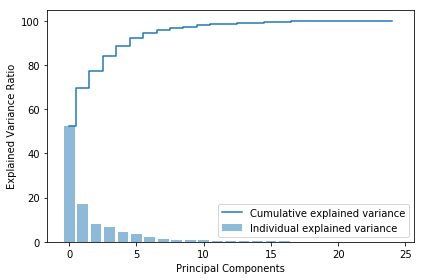

In [15]:
plt.figure(figsize=(6,4))
plt.bar(range(X.shape[1]),var_exp,alpha=0.5,align='center',label='Individual explained variance')
plt.step(range(X.shape[1]),cum_var_exp,where='mid',label='Cumulative explained variance')
plt.ylabel('Explained Variance Ratio')
plt.xlabel('Principal Components')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

In [101]:
temp1=pd.DataFrame(eig_vecs)
temp1=temp1.T
t2=pd.DataFrame(eig_vals,columns=['values'])
t1=pd.concat([temp1,t2],axis=1,join='outer')
t1=t1.sort_values(by=['values'],ascending=False)
t1

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,values
0,0.228966,0.106202,0.236934,0.230592,0.137596,0.235157,0.257434,0.263844,0.132320,0.208821,0.213666,0.207952,0.160467,0.145132,0.177742,0.237894,0.107456,0.245857,0.234362,0.124949,0.207656,0.227885,0.254245,0.120534,0.122902,13.120391
1,0.235422,0.060580,0.214213,0.244335,-0.232083,-0.201788,-0.090357,0.010945,-0.234527,0.169847,0.149439,0.209081,-0.235989,-0.197752,-0.114337,0.211256,0.015959,0.187590,0.222815,-0.256447,-0.238943,-0.180498,-0.060015,-0.238230,-0.359407,4.301542
2,-0.058255,-0.345246,-0.049865,-0.028719,0.002770,0.040203,0.084905,0.011609,0.026756,0.220364,0.234269,0.170406,0.284020,0.344960,0.368146,-0.110064,-0.452879,-0.097781,-0.082582,-0.223501,-0.143149,-0.070047,-0.102639,-0.254021,-0.112839,1.966776
3,0.055400,-0.509928,0.052705,0.058140,0.351976,0.026471,-0.048340,0.093157,0.184330,0.020330,-0.009532,0.046650,-0.289449,-0.316855,-0.189494,0.070626,-0.437568,0.058497,0.071893,0.288799,-0.050558,-0.098730,0.061617,0.182215,-0.025457,1.698597
4,-0.174234,0.318298,-0.165782,-0.115191,0.307902,-0.014952,-0.070266,-0.029568,0.327724,0.364328,0.334707,0.280984,-0.062859,-0.115103,0.019937,-0.118930,0.268542,-0.121860,-0.063664,0.185120,-0.199189,-0.243103,-0.170610,0.046008,-0.092685,1.139985
5,-0.027481,0.041826,-0.023456,-0.016254,0.371563,0.043938,0.036143,0.071736,-0.541245,-0.016788,-0.031502,-0.000366,-0.045433,-0.017078,0.077921,-0.022737,0.060098,-0.028104,-0.009211,0.420353,-0.021522,0.013279,0.061572,-0.593111,0.098382,0.833958
6,0.132205,0.131201,0.121400,0.058608,0.234007,-0.038226,0.076996,0.178637,0.265182,-0.251454,-0.269652,-0.320950,-0.126562,0.153196,0.405504,0.014898,0.078604,-0.003984,-0.061307,0.036339,-0.301612,-0.087339,0.123073,-0.015765,-0.463028,0.572704
7,0.097340,0.130053,0.121823,0.034857,0.118329,0.404294,-0.092994,0.141968,0.168012,-0.100407,-0.004194,-0.161985,0.314764,-0.501433,0.007785,-0.032476,-0.070317,0.007408,-0.096741,-0.316227,0.192024,-0.308135,-0.059150,-0.278455,0.088825,0.339315
8,-0.036909,-0.073015,-0.056540,-0.100143,-0.169758,-0.118862,-0.396993,-0.121547,-0.218162,0.065481,0.110725,-0.053204,0.088848,-0.265148,0.598584,0.086976,0.032801,0.079404,0.035187,0.161426,0.108236,-0.215132,0.306038,0.257240,0.034840,0.249525
9,0.150041,-0.008147,0.127978,0.177435,0.175340,-0.053197,-0.203945,-0.236086,-0.097996,-0.079451,-0.166680,0.006291,0.555602,0.218218,-0.161639,0.121237,0.014254,0.074809,0.170001,0.263761,-0.052224,-0.261628,-0.366560,0.197876,-0.093871,0.173430


In [102]:
p_reduce=t1.iloc[:8,:-1]#droping values and last insignificant pca
p_reduce=p_reduce.T
p_reduce

,0,1,2,3,4,5,6,7
0,0.228966,0.235422,-0.058255,0.055400,-0.174234,-0.027481,0.132205,0.097340
1,0.106202,0.060580,-0.345246,-0.509928,0.318298,0.041826,0.131201,0.130053
2,0.236934,0.214213,-0.049865,0.052705,-0.165782,-0.023456,0.121400,0.121823
3,0.230592,0.244335,-0.028719,0.058140,-0.115191,-0.016254,0.058608,0.034857
4,0.137596,-0.232083,0.002770,0.351976,0.307902,0.371563,0.234007,0.118329
5,0.235157,-0.201788,0.040203,0.026471,-0.014952,0.043938,-0.038226,0.404294
6,0.257434,-0.090357,0.084905,-0.048340,-0.070266,0.036143,0.076996,-0.092994
7,0.263844,0.010945,0.011609,0.093157,-0.029568,0.071736,0.178637,0.141968
8,0.132320,-0.234527,0.026756,0.184330,0.327724,-0.541245,0.265182,0.168012
9,0.208821,0.169847,0.220364,0.020330,0.364328,-0.016788,-0.251454,-0.100407


In [103]:
X_pca=np.dot(X,p_reduce)
X_pca.shape

(569, 8)

In [104]:
X_PCA=pd.DataFrame(X_pca)
X_PCA.head()

,0,1,2,3,4,5,6,7
0,-2.435528,-0.311040,1.029146,2.072855,-0.088952,-0.124366,0.929895,-0.158729
1,-1.604055,-1.111972,1.168413,-0.404756,0.908187,-0.501474,-0.127763,0.407821
2,-2.884022,-0.622225,-0.648709,0.873389,0.623275,0.451911,0.285519,-0.139383
3,-2.024122,-0.984558,2.368593,1.226611,0.311186,1.379495,1.023477,0.945775
4,-2.272882,1.467035,0.782330,1.039939,-1.737994,-0.571840,0.209379,0.281846


#Classification models

In [0]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier 
from sklearn.ensemble import BaggingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import AdaBoostClassifier,GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB



In [0]:
LR=LogisticRegression()
knn=KNeighborsClassifier()
dt_model=DecisionTreeClassifier(criterion='entropy',random_state=0)#fully grown decision tree high bias error
rf_model=RandomForestClassifier(n_estimators=33,criterion='entropy',random_state=0)
bag_model=BaggingClassifier(n_estimators=10)
model_ada=AdaBoostClassifier(n_estimators=2)#default decision tree
model_grad=GradientBoostingClassifier(n_estimators=2000)
model_ada_rf=AdaBoostClassifier(base_estimator=rf_model,n_estimators=100)
Gauss_NB=GaussianNB()



In [0]:

models=[]
models.append(('MVLR',LR))
models.append(('KNN_BASE',knn))
models.append(('Decision Tree',dt_model))
models.append(('RandomForest',rf_model))
models.append(('BaggedDT',bag_model))
models.append(('Adaboost_DT',model_ada))
models.append(('GradientBoosting',model_grad))
models.append(('Adaboost_RF',model_ada_rf))
models.append(('Naive Bayes',Gauss_NB))

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  Futur

MVLR: 99.615491
		Bais error :  0.003845087673332137
		Variance error:  1.776706632891142e-05
KNN_BASE: 98.550028
		Bais error :  0.014499718779663162
		Variance error:  6.0300166835915656e-05
Decision Tree: 92.523408
		Bais error :  0.07476592108072211
		Variance error:  0.0003415213365619103
RandomForest: 98.899069
		Bais error :  0.011009312808645255
		Variance error:  4.626616150394153e-05
BaggedDT: 97.723749
		Bais error :  0.022762508113222446
		Variance error:  0.00018472029614282625
Adaboost_DT: 94.847747
		Bais error :  0.05152252839930882
		Variance error:  0.0005579590576818569
GradientBoosting: 98.650454
		Bais error :  0.013495458068455868
		Variance error:  0.00012049517032684412
Adaboost_RF: 98.877110
		Bais error :  0.011228903930430967
		Variance error:  4.369182270881055e-05
Naive Bayes: 97.927756
		Bais error :  0.020722441455206186
		Variance error:  0.00017972201730364552


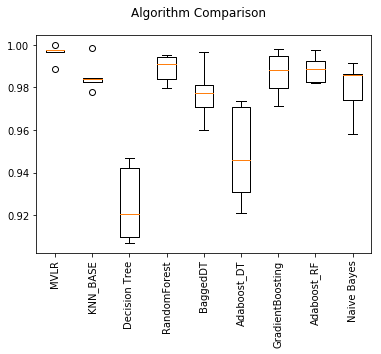

In [108]:
#for classification
results = []
names = []
for name, model in models:
    kfold = KFold(n_splits=5,shuffle=True,random_state=0)
    auc =cross_val_score(model,X_PCA,y,cv=kfold,scoring='roc_auc')
    results.append(auc)
    names.append(name)
    print('%s: %f' % (name,np.mean(auc*100)))
    BE =1-np.mean(auc)#Bias error
    VE =np.var(1-auc,ddof=1)#variance error
    print("\t\tBais error : ", BE)
    print("\t\tVariance error: ",VE)
    
fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.xticks(rotation=90)
plt.show()

In [110]:
X.shape

(569, 25)

In [111]:
LR.fit(X[:500],y[:500])

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [0]:
ypred=LR.predict(X.iloc[501:515,:])


In [113]:

ypred

array([1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1])

In [114]:
y[501:515]

501    1
502    1
503    0
504    0
505    0
506    0
507    0
508    1
509    1
510    0
511    1
512    1
513    0
514    1
Name: diagnosis, dtype: int64

# Wine-Quality red

In [180]:
from google.colab import files
files.upload()

Saving winequality-red.csv to winequality-red (1).csv


{'winequality-red.csv': b'fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality\r\n7.4,0.7,0,1.9,0.076,11,34,0.9978,3.51,0.56,9.4,5\r\n7.8,0.88,0,2.6,0.098,25,67,0.9968,3.2,0.68,9.8,5\r\n7.8,0.76,0.04,2.3,0.092,15,54,0.997,3.26,0.65,9.8,5\r\n11.2,0.28,0.56,1.9,0.075,17,60,0.998,3.16,0.58,9.8,6\r\n7.4,0.7,0,1.9,0.076,11,34,0.9978,3.51,0.56,9.4,5\r\n7.4,0.66,0,1.8,0.075,13,40,0.9978,3.51,0.56,9.4,5\r\n7.9,0.6,0.06,1.6,0.069,15,59,0.9964,3.3,0.46,9.4,5\r\n7.3,0.65,0,1.2,0.065,15,21,0.9946,3.39,0.47,10,7\r\n7.8,0.58,0.02,2,0.073,9,18,0.9968,3.36,0.57,9.5,7\r\n7.5,0.5,0.36,6.1,0.071,17,102,0.9978,3.35,0.8,10.5,5\r\n6.7,0.58,0.08,1.8,0.097,15,65,0.9959,3.28,0.54,9.2,5\r\n7.5,0.5,0.36,6.1,0.071,17,102,0.9978,3.35,0.8,10.5,5\r\n5.6,0.615,0,1.6,0.089,16,59,0.9943,3.58,0.52,9.9,5\r\n7.8,0.61,0.29,1.6,0.114,9,29,0.9974,3.26,1.56,9.1,5\r\n8.9,0.62,0.18,3.8,0.176,52,145,0.9986,3.16,0.88,9.2,5\r\n8.9,0.62,0.1

In [181]:
df=pd.read_csv('winequality-red.csv')
df.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


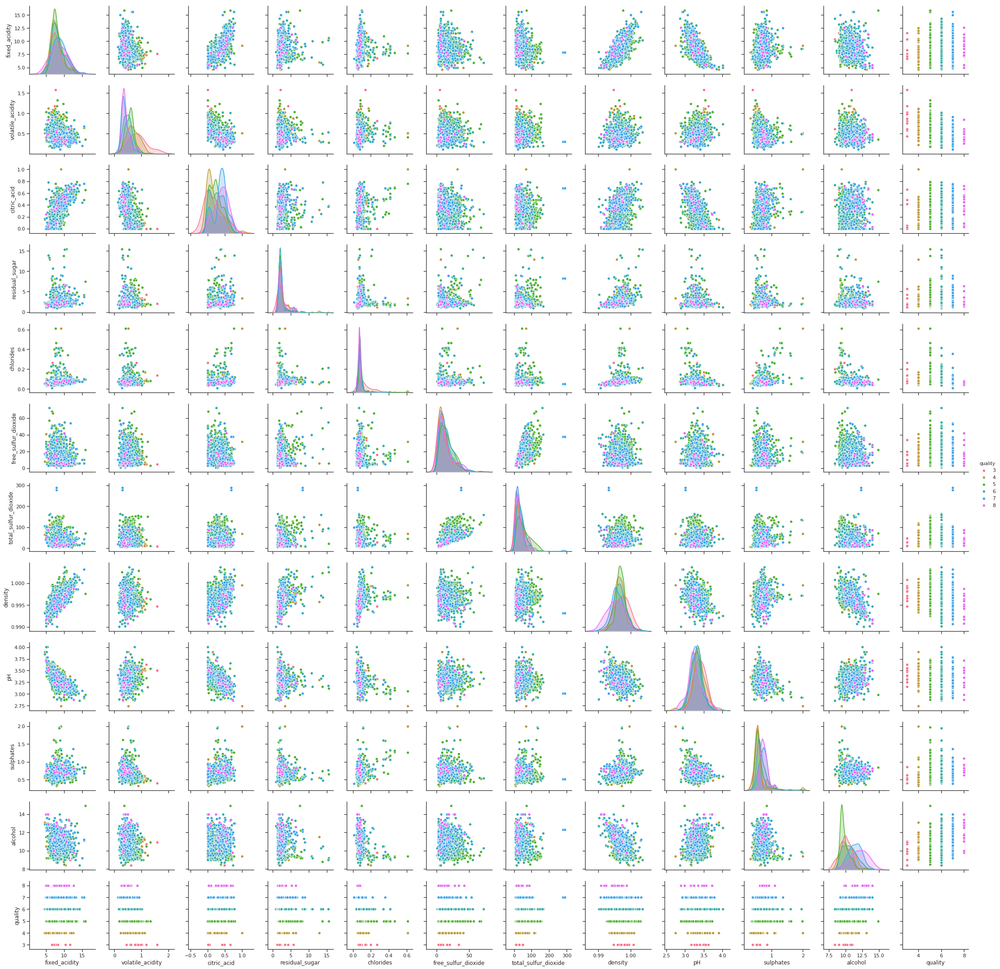

In [182]:
sns.set(style='ticks',color_codes=True)
sns.pairplot(df,hue='quality',palette='husl')
plt.show()

Only 3 features are good

In [183]:
abs(df.corr()['quality']).sort_values()

residual_sugar          0.013732
free_sulfur_dioxide     0.050656
pH                      0.057731
fixed_acidity           0.124052
chlorides               0.128907
density                 0.174919
total_sulfur_dioxide    0.185100
citric_acid             0.226373
sulphates               0.251397
volatile_acidity        0.390558
alcohol                 0.476166
quality                 1.000000
Name: quality, dtype: float64

# MVLR

In [184]:
from scipy.stats import stats
d=[]
for i in df.columns[:-1]:
  g3=df[df['quality']==3][i]
  g4=df[df['quality']==4][i]
  g5=df[df['quality']==5][i]
  g6=df[df['quality']==6][i]
  g7=df[df['quality']==7][i]
  g8=df[df['quality']==8][i]
  p=stats.f_oneway(g3,g4,g5,g6,g7,g8)[1]
  print(p)
  if(p<0.05):
    d.append(i)
d

8.793966623816744e-06
3.326465060517583e-58
4.421091574500041e-19
0.3846187754292449
1.526539024860758e-05
0.00025708272340177853
8.533598445272067e-25
8.12439473703842e-13
0.00062843887009581
1.2258900918533501e-21
1.2098951599308851e-104


['fixed_acidity',
 'volatile_acidity',
 'citric_acid',
 'chlorides',
 'free_sulfur_dioxide',
 'total_sulfur_dioxide',
 'density',
 'pH',
 'sulphates',
 'alcohol']

In [0]:
X=df[['fixed_acidity','volatile_acidity','citric_acid','chlorides','free_sulfur_dioxide','total_sulfur_dioxide','density','pH','sulphates','alcohol']]
y=df['quality']

In [186]:
X.shape

(1599, 10)

In [187]:
#optimum no of features to select for RFE
nof_list=np.arange(1,12)            
high_score=0
#Variable to store the optimum features
nof=0           
score_list =[]
for n in range(len(nof_list)):
    X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.3, random_state = 0)
    model = LinearRegression()
    rfe = RFE(model,nof_list[n])
    X_train_rfe = rfe.fit_transform(X_train,y_train)
    X_test_rfe = rfe.transform(X_test)
    model.fit(X_train_rfe,y_train)
    score = model.score(X_test_rfe,y_test)
    score_list.append(score)
    if(score>high_score):
        high_score = score
        nof = nof_list[n]
print("Optimum number of features: %d" %nof)
print("Score with %d features: %f" % (nof, high_score))

Optimum number of features: 10
Score with 10 features: 0.321343


In [188]:
cols = list(X.columns)
model = LinearRegression()
#Initializing RFE model
rfe = RFE(model, 10)             
#Transforming data using RFE
X_rfe = rfe.fit_transform(X,y)  
#Fitting the data to model
model.fit(X_rfe,y)              
temp = pd.Series(rfe.support_,index = cols)
selected_features_rfe = temp[temp==True].index
print(selected_features_rfe)

Index(['fixed_acidity', 'volatile_acidity', 'citric_acid', 'chlorides',
       'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density', 'pH',
       'sulphates', 'alcohol'],
      dtype='object')


In [0]:
X_new=X[selected_features_rfe]

In [285]:
knn=KNeighborsClassifier()
params={'n_neighbors':np.arange(1,200),'weights':['uniform','distance']}
GS=RandomizedSearchCV(knn,params,cv=10,scoring='f1_weighted')
GS.fit(X_new,y)

RandomizedSearchCV(cv=10, error_score='raise-deprecating',
                   estimator=KNeighborsClassifier(algorithm='auto',
                                                  leaf_size=30,
                                                  metric='minkowski',
                                                  metric_params=None,
                                                  n_jobs=None, n_neighbors=5,
                                                  p=2, weights='uniform'),
                   iid='warn', n_iter=10, n_jobs=None,
                   param_distributions={'n_neighbors': array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        2...
       144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156,
       157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169,
       170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182,
       183, 184, 185, 186, 187, 1

In [286]:
GS.best_params_

{'n_neighbors': 68, 'weights': 'distance'}

In [0]:
LR=LogisticRegression()
knn=KNeighborsClassifier(n_neighbors=68,weights='distance')
dt_model=DecisionTreeClassifier(criterion='entropy',random_state=0)#fully grown decision tree high bias error
rf_model=RandomForestClassifier(n_estimators=2153,criterion='entropy',random_state=0)
bag_model=BaggingClassifier(n_estimators=10,random_state=0)
model_ada=AdaBoostClassifier(n_estimators=2,random_state=0)#default decision tree
model_grad=GradientBoostingClassifier(n_estimators=20,random_state=0)
model_ada_rf=AdaBoostClassifier(base_estimator=rf_model,n_estimators=500,random_state=0)
Gauss_NB=GaussianNB()

In [0]:
models=[]
models.append(('MVLR',LR))
models.append(('KNN_BASE',knn))
models.append(('Decision Tree',dt_model))
models.append(('RandomForest',rf_model))
models.append(('BaggedDT',bag_model))
models.append(('Adaboost_DT',model_ada))
models.append(('GradientBoosting',model_grad))
models.append(('Adaboost_RF',model_ada_rf))
models.append(('Naive Bayes',Gauss_NB))

In [0]:
import sys
import warnings
warnings.simplefilter("ignore")

In [302]:
a = df.groupby('quality')
q3 = a.get_group(3)
q4 = a.get_group(4)
q5 = a.get_group(5)
q6 = a.get_group(6)
q7 = a.get_group(7)
q8 = a.get_group(8)
a1 = q3.iloc[:3,:]
a2 = q4.iloc[:7,:]
a3 = q5.iloc[:42,:]
a4 = q6.iloc[:25,:]
a5 = q7.iloc[:15,:]
a6 = q8.iloc[:4,:]
x_prod = pd.concat([a1,a2,a3,a4,a5,a6],axis=0)
x_prod.shape

(96, 12)

In [304]:
a = df.groupby('quality')
q3 = a.get_group(3)
q4 = a.get_group(4)
q5 = a.get_group(5)
q6 = a.get_group(6)
q7 = a.get_group(7)
q8 = a.get_group(8)
a1 = q3.iloc[3:,:]
a2 = q4.iloc[7:,:]
a3 = q5.iloc[42:,:]
a4 = q6.iloc[25:,:]
a5 = q7.iloc[15:,:]
a6 = q8.iloc[4:,:]
dftrain= pd.concat([a1,a2,a3,a4,a5,a6],axis=0)
dftrain.shape

(1503, 12)

In [0]:
X_new=dftrain[['fixed_acidity','volatile_acidity','citric_acid','chlorides','free_sulfur_dioxide','total_sulfur_dioxide','density','pH','sulphates','alcohol']]
y=dftrain['quality']

MVLR: 54.095674
		Bais error :  0.4590432563265294
		Variance error:  0.04423905921030086
KNN_BASE: 63.276284
		Bais error :  0.3672371645803325
		Variance error:  0.03676601585083989
Decision Tree: 66.202707
		Bais error :  0.33797292980977345
		Variance error:  0.02858921552643957
RandomForest: 69.485903
		Bais error :  0.3051409657252081
		Variance error:  0.028471246040613508
BaggedDT: 67.683363
		Bais error :  0.32316637185116326
		Variance error:  0.03301053480742744
Adaboost_DT: 49.783211
		Bais error :  0.5021678880866041
		Variance error:  0.040170603482021845
GradientBoosting: 60.221006
		Bais error :  0.3977899367524682
		Variance error:  0.038816917338569
Adaboost_RF: 69.529632
		Bais error :  0.30470368143257676
		Variance error:  0.02873905699888455
Naive Bayes: 56.811844
		Bais error :  0.43188155874540635
		Variance error:  0.04660301417945567


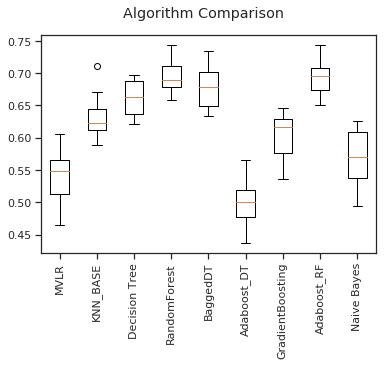

In [311]:
#for classification
results = []
names = []
for name, model in models:
    kfold = KFold(n_splits=10,shuffle=True,random_state=0)
    auc =cross_val_score(model,X_new,y,cv=kfold,scoring='f1_weighted')
    results.append(auc)
    names.append(name)
    print('%s: %f' % (name,np.mean(auc*100)))
    BE =1-np.mean(auc)#Bias error
    VE =np.std(1-auc,ddof=1)#variance error
    print("\t\tBais error : ", BE)
    print("\t\tVariance error: ",VE)
    
fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.xticks(rotation=90)
plt.show()

In [0]:
from sklearn.ensemble import VotingClassifier

In [0]:
stacked=VotingClassifier(estimators=[('Bagged DT',bag_model),('Random Forest',rf_model),('Boosted RF',model_ada_rf)])

In [0]:
models=[]
models.append(('stacked',stacked))

stacked: 68.633638
		Bais error :  0.3136636198534578
		Variance error:  0.001009988078666827


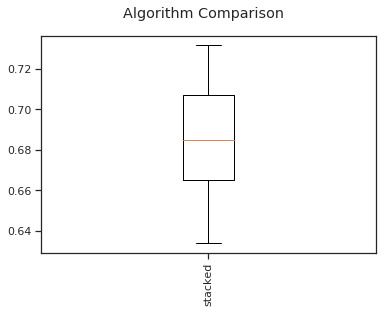

In [300]:
#for classification
results = []
names = []
for name, model in models:
    kfold = KFold(n_splits=10,shuffle=True,random_state=0)
    auc =cross_val_score(model,X_new,y,cv=kfold,scoring='f1_weighted')
    results.append(auc)
    names.append(name)
    print('%s: %f' % (name,np.mean(auc*100)))
    BE =1-np.mean(auc)#Bias error
    VE =np.var(1-auc,ddof=1)#variance error
    print("\t\tBais error : ", BE)
    print("\t\tVariance error: ",VE)
    
fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.xticks(rotation=90)
plt.show()

Random Forest is the best model

In [312]:
model_ada_rf.fit(X_new,y)

AdaBoostClassifier(algorithm='SAMME.R',
                   base_estimator=RandomForestClassifier(bootstrap=True,
                                                         class_weight=None,
                                                         criterion='entropy',
                                                         max_depth=None,
                                                         max_features='auto',
                                                         max_leaf_nodes=None,
                                                         min_impurity_decrease=0.0,
                                                         min_impurity_split=None,
                                                         min_samples_leaf=1,
                                                         min_samples_split=2,
                                                         min_weight_fraction_leaf=0.0,
                                                         n_estimators=2153,
                    

In [0]:
xtest=x_prod[['fixed_acidity','volatile_acidity','citric_acid','chlorides','free_sulfur_dioxide','total_sulfur_dioxide','density','pH','sulphates','alcohol']]
ytest=x_prod['quality']

In [316]:
ypred=model_ada_rf.predict(xtest)
ypred

array([5, 6, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 6, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5,
       6, 5, 5, 6, 5, 5, 5, 6, 6, 6, 6, 5, 5, 5, 6, 5, 6, 7, 6, 7, 7, 6,
       6, 6, 6, 6, 7, 7, 7, 6])

In [321]:
from sklearn.metrics import classification_report,confusion_matrix
print(classification_report(ytest,ypred))
print(confusion_matrix(ytest,ypred))

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         3
           4       0.00      0.00      0.00         7
           5       0.57      0.90      0.70        42
           6       0.35      0.32      0.33        25
           7       0.50      0.20      0.29        15
           8       0.00      0.00      0.00         4

    accuracy                           0.51        96
   macro avg       0.24      0.24      0.22        96
weighted avg       0.42      0.51      0.44        96

[[ 0  0  2  1  0  0]
 [ 0  0  6  1  0  0]
 [ 0  0 38  4  0  0]
 [ 0  0 17  8  0  0]
 [ 0  0  4  8  3  0]
 [ 0  0  0  1  3  0]]
